# 미션

In [20]:
import numpy as np
import os 
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.simplefilter(action = 'ignore', category = FutureWarning)

import plotly.express as px

mpl.rc('font',family = 'Malgun Gothic') # 시각화 때 한글 안깨짐

In [3]:
df1 = pd.read_csv('06_Data.csv')
df1.head(2)

,Unnamed: 0,날짜,SKU ID,SKU 명,바코드,발주가능상태,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,자재명,카테고리,입수,출고수량,재고수량
0,0,2019-05-16,29349,리큐진한겔일반 3LNEW,8801046893111,발주가능,384,287,5788,6077374,19리큐 진한겔 알카2.7용기(일),세탁세제,4,71.75,80.668990
1,1,2019-05-16,29350,리큐 진한겔드럼 3L NEW,8801046893128,발주가능,0,235,2772,6077394,19리큐 진한겔 알카2.7용기(드),세탁세제,4,58.75,47.182979


In [4]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36833 entries, 0 to 36832
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  36833 non-null  int64  
 1   날짜          36833 non-null  object 
 2   SKU ID      36833 non-null  int64  
 3   SKU 명       36833 non-null  object 
 4   바코드         36833 non-null  object 
 5   발주가능상태      36833 non-null  object 
 6   입고수량        36833 non-null  int64  
 7   쿠팡출고수량      36833 non-null  int64  
 8   쿠팡현재재고수량    36833 non-null  int64  
 9   자재번호        36833 non-null  int64  
 10  자재명         36833 non-null  object 
 11  카테고리        36833 non-null  object 
 12  입수          36833 non-null  int64  
 13  출고수량        36833 non-null  float64
 14  재고수량        36833 non-null  float64
dtypes: float64(2), int64(7), object(6)
memory usage: 4.2+ MB


In [5]:
df1.drop(columns = 'Unnamed: 0', inplace = True)

## 1. 2019년 5월 대비 8월의 "쿠팡출고수량"이 몇 퍼센트 증가했는지 계산하시오.

In [6]:
df1['날짜_dt'] = pd.to_datetime(df1['날짜'])

df1['년도'] = df1['날짜_dt'].dt.year
df1['월'] = df1['날짜_dt'].dt.month
df1
# df1['월'].unique()

,날짜,SKU ID,SKU 명,바코드,발주가능상태,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,자재명,카테고리,입수,출고수량,재고수량,날짜_dt,년도,월
0,2019-05-16,29349,리큐진한겔일반 3LNEW,8801046893111,발주가능,384,287,5788,6077374,19리큐 진한겔 알카2.7용기(일),세탁세제,4,71.750000,80.668990,2019-05-16,2019,5
1,2019-05-16,29350,리큐 진한겔드럼 3L NEW,8801046893128,발주가능,0,235,2772,6077394,19리큐 진한겔 알카2.7용기(드),세탁세제,4,58.750000,47.182979,2019-05-16,2019,5
2,2019-05-16,29351,울샴푸아웃도어 800ml 용기,8801046878934,발주가능,0,2,35,6077406,19울샴푸아웃도 800ml(리뉴얼),세탁세제,9,0.222222,157.500000,2019-05-16,2019,5
3,2019-05-16,29352,울샴푸아웃도어 1L 일자형 리필,8801046878941,발주가능,207,41,2083,6077404,19울샴푸아웃도 1L(리뉴얼),세탁세제,9,4.555556,457.243902,2019-05-16,2019,5
4,2019-05-16,29359,Pack 2080오리지날칫솔 5+5입_탄력모,8801046888858,발주가능,288,312,3411,5009109,182080오리지날칫솔 5+5입(탄력모),덴탈케어,8,39.000000,87.461538,2019-05-16,2019,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36828,2019-08-07,10360959,"샤워메이트 보타닉테라스 워시 버베나 1.2kg, 1개",8801046329085,발주가능,8,13,118,6075867,19샤워메이트보타닉테라 1.2Kg버베나(온)책,세탁세제,8,1.625000,72.615385,2019-08-07,2019,8
36829,2019-08-07,10360960,"2080 퓨어 핑크솔트 가글 750ML, 1개",8801046330296,발주가능,12,3,11,6076086,192080가글 핑크솔트750ML(마일드,세탁세제,6,0.500000,22.000000,2019-08-07,2019,8
36830,2019-08-07,10360962,"샤워메이트 보타닉테라스 워시 카렌듈라 1.2kg, 1개",8801046329092,발주가능,64,45,115,6075870,19샤워메이트보타닉테 1.2Kg카렌듈라(온)책,세탁세제,8,5.625000,20.444444,2019-08-07,2019,8
36831,2019-08-07,10365807,스팀클리너 10입 CASE,8801046325315,발주가능,25,8,217,5009289,18스팀클리너 9+1입 CASE,세탁세제,25,0.320000,678.125000,2019-08-07,2019,8


In [7]:
p1 = df1.pivot_table(index = ['년도','월'],
                values = '쿠팡출고수량',
                aggfunc='sum')
p1
# 년도가 별 상관 없구나 -> 월로만 index주자

쿠팡출고수량
년도   월        
2019 5  301973
     6  608557
     7  617329
     8  141153

In [128]:
# 선생님 
# 피봇테이블 p 보면 전치하면 row 가져올 수 있다.
p1 = df1.pivot_table(index = '월',
                values = '쿠팡출고수량',
                aggfunc='sum').T 

p1
p1[5]

쿠팡출고수량    301973
Name: 5, dtype: int64

In [129]:
(p1[8] - p1[5])/ p1[5]

쿠팡출고수량   -0.532564
dtype: float64

In [178]:
cond1 = (df1['월']==5)
cond2 = (df1['월']==8)

m5 = df1.loc[cond1]
m8 = df1.loc[cond2]


per = (m8['쿠팡출고수량'].sum() - m5['쿠팡출고수량'].sum())/df1['쿠팡출고수량'].sum() * 100
print(f"8월의 5월대비 증감율 = {per:.3f}%")

8월의 5월대비 증감율 = -9.636%


## 2. 각 카테고리 별 5월 대비 8월의 "쿠팡출고수량"의 증감율을 계산하시오. 

In [13]:
# 선생님 
p2 = df1.pivot_table(index = '카테고리',
                values = '쿠팡출고수량',
                aggfunc='sum',
                columns = '월').reset_index()
p2['Rate'] = (p2[8] - p2[5])/p2[5]
p2[[5,8,'Rate']]

월,5,8,Rate
0,23687,9905,-0.581838
1,2442,1615,-0.338657
2,1647,874,-0.469338
3,74280,30661,-0.587224
4,1769,635,-0.641040
5,90089,44910,-0.501493
6,46048,24490,-0.468164
7,62011,28063,-0.547451


In [179]:
p2 = df1.pivot_table(index = '월',
                values = '쿠팡출고수량',
                aggfunc='sum',
                columns = '카테고리').reset_index()
p2

카테고리,월,F&B,ST,기타,덴탈케어,매입브랜드,세탁세제,주방세제,헤어케어
0,5,23687,2442,1647,74280,1769,90089,46048,62011
1,6,46424,7805,3644,151319,2856,169955,113322,113232
2,7,42573,8383,3215,144956,2795,184832,108331,122244
3,8,9905,1615,874,30661,635,44910,24490,28063


In [184]:
tag = p2.columns[1:]
# tag

cond1 = (p2['월']==5)
cond2 = (p2['월']==8)

m5 = p2.loc[cond1]
m8 = p2.loc[cond2]

m1 = pd.concat([m5,m8])
# m1
# m1['ST'][3]

result = []
for x in tag:
#     print(x)
    per = ( m1[x][3]- m1[x][0])/(m1[x][3]+m1[x][0]) * 100
    result.append(per)

for x in range(len(tag)):
    print(f"{tag[x]}의 증감율 {result[x]}")  

F&B의 증감율 -41.02762562514884
ST의 증감율 -20.384520581710625
기타의 증감율 -30.662435541451806
덴탈케어의 증감율 -41.56526047969812
매입브랜드의 증감율 -47.171381031613976
세탁세제의 증감율 -33.466173823509806
주방세제의 증감율 -30.562250134679182
헤어케어의 증감율 -37.68901125741058


## 3. '발주가능상태'에서 '발주중단' 된 데이터의 특성을 파악하고자 한다. '발주중단' 데이터만 추출하여, 카테고리의 빈도수를 확인하고, 연속형 자료의 기술통계량을 계산하시오. 

In [162]:
cond1 = (df1['발주가능상태'] == '발주중단')
df2 = df1.loc[cond1]

df2['카테고리'].value_counts()

카테고리
헤어케어    78
세탁세제    14
덴탈케어     3
Name: count, dtype: int64

In [163]:
pd.options.display.float_format = '{:.2f}'.format
df2.describe()

,SKU ID,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,입수,출고수량,재고수량,날짜_dt,년도,월
count,95.00,95.00,95.00,95.00,95.00,95.00,95.00,95.00,95,95.00,95.00
mean,3559700.28,14.36,10.99,516.53,6038456.55,7.52,2.10,318.16,2019-07-15 00:00:00,2019.00,7.00
min,309777.00,0.00,0.00,0.00,5008395.00,4.00,0.00,0.00,2019-06-18 00:00:00,2019.00,6.00
25%,2383418.00,0.00,2.00,20.50,6068195.00,4.00,0.20,43.04,2019-07-09 12:00:00,2019.00,7.00
50%,3367647.00,0.00,8.00,164.00,6075507.00,10.00,0.80,210.00,2019-07-15 00:00:00,2019.00,7.00
75%,3367649.00,0.00,14.50,246.00,6075508.00,10.00,3.38,379.31,2019-07-21 00:00:00,2019.00,7.00
max,10239645.00,216.00,100.00,3077.00,6075508.00,10.00,16.67,2080.00,2019-08-07 00:00:00,2019.00,8.00
std,2659679.32,40.20,14.44,938.43,187031.92,2.76,2.91,399.03,NaN,0.00,0.46


## 4. 19년도 7월 2번째 주에 '쿠팡출고수량'이 가장 많은 '카테고리'는 무엇인지 확인하시오.

In [24]:
# 선생님 

t1 = df1['날짜_dt'].dt.isocalendar()
t1.drop_duplicates()  # 중복된 행 없이 출력

,year,week,day
0,2019,20,4
471,2019,20,5
942,2019,20,6
1420,2019,20,7
1898,2019,21,1
...,...,...,...
35249,2019,31,6
35552,2019,31,7
35859,2019,32,1
36186,2019,32,2


In [25]:
df1['주차'] = df1['날짜_dt'].dt.isocalendar().week

In [27]:
cond1 = (df1['월'] == 7)
df1.loc[cond1]['주차'].unique()

<IntegerArray>
[27, 28, 29, 30, 31]
Length: 5, dtype: UInt32

In [29]:
cond2 = (df1['주차']==28)
p1 = df1.loc[cond1&cond2]

In [31]:
p1.pivot_table(index='카테고리', values = '쿠팡출고수량',
              aggfunc = 'sum').sort_values(by = '쿠팡출고수량', ascending = False)

,쿠팡출고수량
카테고리,
세탁세제,42675
덴탈케어,35045
헤어케어,27672
주방세제,25247
F&B,9139
ST,1913
기타,736
매입브랜드,598


In [ ]:
# 선생님 코드 끝

In [164]:
df1['주'] = df1['날짜_dt'].dt.isocalendar().week
# 일년에 걸쳐서 측정되는 주 숫자임

# 조건 걸어서 7월 추출하고 2번째로 큰 주를 고르자
cond1 = (df1['월'] == 7)
df2 = df1.loc[cond1]
df2

w = df2['주'].unique()[1]

cond2 = (df1['주'] == w)
df3 = df2.loc[cond2]
df3

df4 = df3.pivot_table(index = '카테고리',
               values = '쿠팡출고수량',
               aggfunc = 'sum')

top = df4.sort_values(by ='쿠팡출고수량',ascending = False).index[0]
top

'세탁세제'

## 5. 각 '자재명' 별 '쿠팡출고수량', '입고수량'의 평균을 계산하고, 계산된 결과에서 '쿠팡출고수량'의 상위 10% '자재명'을 'A' / 상위 30%를 'B' / 상위 60%를 'C' / 나머지를 'D'로 '등급분류'라는 파생변수를 생성하고, 각 등급에서 가장 많이 등장한 '카테고리'항목이 무엇인지 확인하시오. 

In [32]:
# 선생님 
# 처음부터 카테고리 포함시켜서 df만들어야좋을것이다 문제보고 생각
p3 = df1.pivot_table(index = ['자재명', '카테고리'],
                    values = ['쿠팡출고수량','입고수량'],
                    aggfunc = 'mean').reset_index()
p3

,자재명,카테고리,입고수량,쿠팡출고수량
0,10순샘BubbleOlive 350ml용기,주방세제,50.349650,40.524476
1,14New바세린리프팅 450ml로션,F&B,17.840000,30.246667
2,14순샘제로만다린.M 1.0L파우치-친환경,주방세제,0.000000,0.000000
3,162080 스마트케어웨이브 4입,덴탈케어,21.450331,19.112583
4,162080 스마트케어칫솔_4입,세탁세제,96.000000,34.220779
...,...,...,...,...
349,외2080팔레트 30gx6입(세트),덴탈케어,26.857143,4.471429
350,전2080덴티스트리 나이트리페어 100g(스티,덴탈케어,0.423529,0.117647
351,전2080진지발리스K 진저민트120+20gx3입,덴탈케어,0.000000,0.065574
352,전2080플라워가글 가글재스민 250ml,덴탈케어,0.000000,0.017241


In [43]:
cond1 = (p3['쿠팡출고수량'] >= p1['쿠팡출고수량'].quantile(0.4))
cond2 = (p3['쿠팡출고수량'] >= p1['쿠팡출고수량'].quantile(0.7))
cond3 = (p3['쿠팡출고수량'] >= p1['쿠팡출고수량'].quantile(0.9))

p3['등급'] = 'D'
p3.loc[cond1, '등급'] = 'C' # cond1에만 해당하면 C로 바꿔준다
p3.loc[cond2, '등급'] = 'B'
p3.loc[cond3, '등급'] = 'A'

In [44]:
p3['등급'].value_counts()

등급
C    131
B     97
D     92
A     34
Name: count, dtype: int64

In [165]:
# 각 '자재명' 별 '쿠팡출고수량', '입고수량'의 평균을 계산하고
p1 = df1.pivot_table(index = ['자재명','카테고리'],
                values = ['쿠팡출고수량','입고수량'],
                aggfunc='mean').reset_index()
p1

,자재명,카테고리,입고수량,쿠팡출고수량
0,10순샘BubbleOlive 350ml용기,주방세제,50.35,40.52
1,14New바세린리프팅 450ml로션,F&B,17.84,30.25
2,14순샘제로만다린.M 1.0L파우치-친환경,주방세제,0.00,0.00
3,162080 스마트케어웨이브 4입,덴탈케어,21.45,19.11
4,162080 스마트케어칫솔_4입,세탁세제,96.00,34.22
...,...,...,...,...
349,외2080팔레트 30gx6입(세트),덴탈케어,26.86,4.47
350,전2080덴티스트리 나이트리페어 100g(스티,덴탈케어,0.42,0.12
351,전2080진지발리스K 진저민트120+20gx3입,덴탈케어,0.00,0.07
352,전2080플라워가글 가글재스민 250ml,덴탈케어,0.00,0.02


In [166]:
# 계산된 결과에서 '쿠팡출고수량'의 상위 10% '자재명'을 'A' / 상위 30%를 'B' / 상위 60%를 'C' / 나머지를 'D'
# 등급분류'라는 파생변수를 생성

a = p1['쿠팡출고수량'].quantile(0.9)
b= p1['쿠팡출고수량'].quantile(0.7)
c = p1['쿠팡출고수량'].quantile(0.4)
# print(a,b,c)

def get_lev(x):
    if x >= a:
        return 'A'
    elif x>= b:
        return 'B'
    elif x>= c:
        return 'C'
    else:
        return 'D'

p1['등급분류']=p1['쿠팡출고수량'].apply(get_lev)
p1

,자재명,카테고리,입고수량,쿠팡출고수량,등급분류
0,10순샘BubbleOlive 350ml용기,주방세제,50.35,40.52,B
1,14New바세린리프팅 450ml로션,F&B,17.84,30.25,B
2,14순샘제로만다린.M 1.0L파우치-친환경,주방세제,0.00,0.00,D
3,162080 스마트케어웨이브 4입,덴탈케어,21.45,19.11,C
4,162080 스마트케어칫솔_4입,세탁세제,96.00,34.22,B
...,...,...,...,...,...
349,외2080팔레트 30gx6입(세트),덴탈케어,26.86,4.47,C
350,전2080덴티스트리 나이트리페어 100g(스티,덴탈케어,0.42,0.12,D
351,전2080진지발리스K 진저민트120+20gx3입,덴탈케어,0.00,0.07,D
352,전2080플라워가글 가글재스민 250ml,덴탈케어,0.00,0.02,D


In [167]:
# 각 등급에서 가장 많이 등장한 '카테고리'항목이 무엇인지 확인

p1[['카테고리','등급분류']].sort_values(by='등급분류')

p1['카테고리별등급'] = 1
p1

p2 = p1.pivot_table(index = ['카테고리','등급분류'],
              values = '카테고리별등급',
              aggfunc = 'sum')
p2


카테고리별등급
카테고리  등급분류         
F&B   A           3
      B           9
      C           7
      D          13
ST    C          10
      D          32
기타    B           2
      C           1
      D           2
덴탈케어  A           8
      B          15
      C          18
      D          28
매입브랜드 B           1
      C           3
      D           2
세탁세제  A           9
      B          23
      C          38
      D          30
주방세제  A           8
      B          11
      C           7
      D           9
헤어케어  A           8
      B           9
      C          22
      D          26

## 6. '카테고리'를 사용자로부터 입력받아, '발주가능상태'에 따른 '월'(날짜로 부터 계산) 별 '쿠팡출고수량'의 합을 계산하여 시각화 하고 해당 그래프를 '카테고리명_월별_쿠팡출고량.png'파일 형태로 저장하는 함수를 만드시오. 

In [45]:
# 선생님 
target = input('카테고리를 입력하시오 : ')
cond1 = (df1['카테고리'] == target)
p1 = df1.loc[cond1]

카테고리를 입력하시오 :  세탁세제


In [47]:
p2 = p1.pivot_table(index = '발주가능상태', values = '쿠팡출고수량', 
                    columns = '월', aggfunc = 'sum').reset_index()
p2

월,발주가능상태,5,6,7,8
0,단종,NaN,96.0,125.0,16.0
1,발주가능,90089.0,169859.0,184555.0,44790.0
2,발주중단,NaN,NaN,152.0,104.0


In [48]:
# 인덱스에 월을 넣을건지 칼럼에 월을 넣을 건지 문제를 보고 판단
# reset_index는 안 할 이유가 없음

p3 = p1.pivot_table(index = ['발주가능상태','월'],
                   values = '쿠팡출고수량',
                   aggfunc = 'sum').reset_index()
p3

,발주가능상태,월,쿠팡출고수량
0,단종,6,96
1,단종,7,125
2,단종,8,16
3,발주가능,5,90089
4,발주가능,6,169859
5,발주가능,7,184555
6,발주가능,8,44790
7,발주중단,7,152
8,발주중단,8,104


<Axes: xlabel='월', ylabel='쿠팡출고수량'>

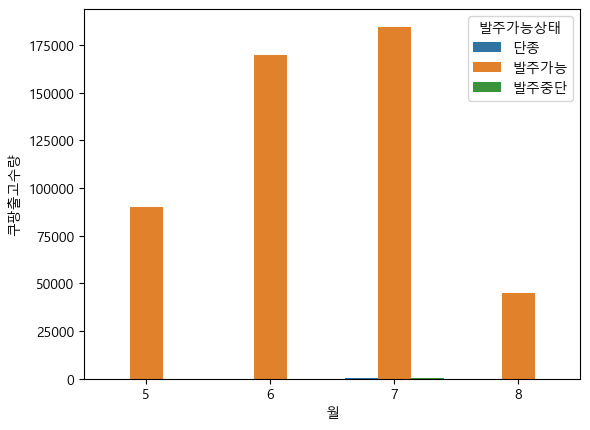

In [49]:
sns.barplot(p3,x='월',y='쿠팡출고수량',hue='발주가능상태')

In [50]:
def func6():
    target = input('카테고리를 입력하시오 : ')
    cond1 = (df1['카테고리'] == target)
    p1 = df1.loc[cond1]
    p3 = p1.pivot_table(index = ['발주가능상태','월'],
                   values = '쿠팡출고수량',
                   aggfunc = 'sum').reset_index()
    sns.barplot(p3,x='월',y='쿠팡출고수량',hue='발주가능상태')
    plt.savefig(f'{target}_월별_쿠팡출고량.png')

카테고리를 입력하시오 :  ST


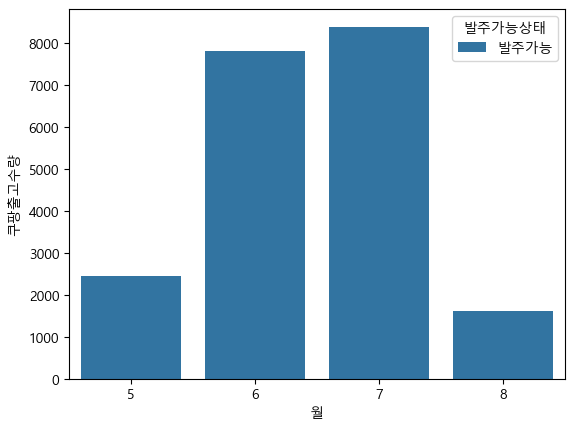

In [51]:
func6()

In [168]:
# '카테고리'를 사용자로부터 입력
c = input('카테고리 입력 [F&B ST 기타 덴탈케어 매입브랜드 세탁세제 주방세제 헤어케어]: ')

카테고리 입력 [F&B ST 기타 덴탈케어 매입브랜드 세탁세제 주방세제 헤어케어]: 


<Axes: xlabel='월', ylabel='쿠팡출고수량'>

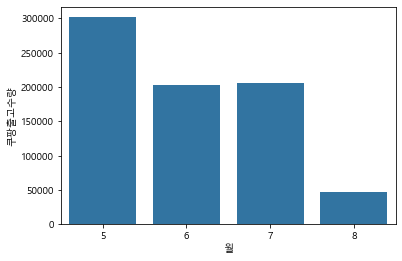

In [169]:
# '발주가능상태'에 따른 '월'(날짜로 부터 계산) 별 '쿠팡출고수량'의 합을 계산하여 시각화 
p1 = df1.pivot_table(index = ['발주가능상태','월'], 
                values = '쿠팡출고수량',
                aggfunc = 'sum').reset_index()

sns.barplot(data=p1,x='월',y='쿠팡출고수량',errorbar = None )

카테고리 입력 [F&B ST 기타 덴탈케어 매입브랜드 세탁세제 주방세제 헤어케어]: 


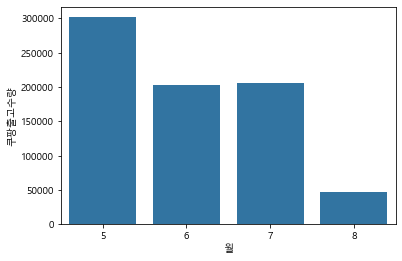

In [170]:
#해당 그래프를 '카테고리명_월별_쿠팡출고량.png'파일 형태로 저장하는 함수

def save():
    c = input('카테고리 입력 [F&B ST 기타 덴탈케어 매입브랜드 세탁세제 주방세제 헤어케어]: ')
 
    p1 = df1.pivot_table(index = ['발주가능상태','월'], 
                    values = '쿠팡출고수량',
                    aggfunc = 'sum').reset_index()

    sns.barplot(data=p1,x='월',y='쿠팡출고수량',errorbar = None )
    plt.savefig(f"{c}_월별_쿠팡출고량.png")

save()

## 7. '카테고리'빈도수가 가장 많은 항목의 '입고수량'이 높은 상위 100개 데이터를 result_category.xlsx로 저장하시오.

In [52]:
# 선생님
df1['카테고리'].value_counts()

카테고리
세탁세제     10339
덴탈케어      7596
헤어케어      6812
ST        4361
주방세제      4142
F&B       2583
매입브랜드      593
기타         407
Name: count, dtype: int64

In [57]:
cond1 = (df1['카테고리']==df1['카테고리'].value_counts().index[0])
p1 = df1.loc[cond1]
p1

,날짜,SKU ID,SKU 명,바코드,발주가능상태,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,자재명,카테고리,입수,출고수량,재고수량,날짜_dt,년도,월,주차
0,2019-05-16,29349,리큐진한겔일반 3LNEW,8801046893111,발주가능,384,287,5788,6077374,19리큐 진한겔 알카2.7용기(일),세탁세제,4,71.750000,80.668990,2019-05-16,2019,5,20
1,2019-05-16,29350,리큐 진한겔드럼 3L NEW,8801046893128,발주가능,0,235,2772,6077394,19리큐 진한겔 알카2.7용기(드),세탁세제,4,58.750000,47.182979,2019-05-16,2019,5,20
2,2019-05-16,29351,울샴푸아웃도어 800ml 용기,8801046878934,발주가능,0,2,35,6077406,19울샴푸아웃도 800ml(리뉴얼),세탁세제,9,0.222222,157.500000,2019-05-16,2019,5,20
3,2019-05-16,29352,울샴푸아웃도어 1L 일자형 리필,8801046878941,발주가능,207,41,2083,6077404,19울샴푸아웃도 1L(리뉴얼),세탁세제,9,4.555556,457.243902,2019-05-16,2019,5,20
9,2019-05-16,34399,리큐진한겔드럼 2.1L,8801046247754,발주가능,0,62,2689,6078472,19리큐 진한겔 2.1리필(드)6입A,세탁세제,6,10.333333,260.225806,2019-05-16,2019,5,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36828,2019-08-07,10360959,"샤워메이트 보타닉테라스 워시 버베나 1.2kg, 1개",8801046329085,발주가능,8,13,118,6075867,19샤워메이트보타닉테라 1.2Kg버베나(온)책,세탁세제,8,1.625000,72.615385,2019-08-07,2019,8,32
36829,2019-08-07,10360960,"2080 퓨어 핑크솔트 가글 750ML, 1개",8801046330296,발주가능,12,3,11,6076086,192080가글 핑크솔트750ML(마일드,세탁세제,6,0.500000,22.000000,2019-08-07,2019,8,32
36830,2019-08-07,10360962,"샤워메이트 보타닉테라스 워시 카렌듈라 1.2kg, 1개",8801046329092,발주가능,64,45,115,6075870,19샤워메이트보타닉테 1.2Kg카렌듈라(온)책,세탁세제,8,5.625000,20.444444,2019-08-07,2019,8,32
36831,2019-08-07,10365807,스팀클리너 10입 CASE,8801046325315,발주가능,25,8,217,5009289,18스팀클리너 9+1입 CASE,세탁세제,25,0.320000,678.125000,2019-08-07,2019,8,32


In [56]:
p1.sort_values(by = '입고수량', ascending = False).head(100).to_excel(f"result_{df1['카테고리'].value_counts().index[0]}.xlsx")

In [171]:
top = df1['카테고리'].value_counts().index[0]

cond1 = (df1['카테고리'] == top)
d = df1.loc[cond1]

p1 = d.pivot_table(index = 'SKU 명',
             values = '입고수량',
             aggfunc = 'count').head(100).to_excel('result_category.xlsx')

<ipython-input-171-aa7763a976d2>:6: UserWarning:

Pandas requires version '1.4.3' or newer of 'xlsxwriter' (version '1.2.9' currently installed).



## 8. 각 '카테고리'별 7월과 8월의 '쿠팡출고수량'의 '평균'과 '합'의 차이를 계산하시오. 

In [59]:
p1 = df1.pivot_table(index='카테고리', values = '쿠팡출고수량',
               columns = '월', aggfunc = ['sum','mean'])
p1
# 멀티 인덱스 상태

sum                              mean                        \
월          5       6       7      8          5          6          7   
카테고리                                                                   
F&B    23687   46424   42573   9905  43.067273  48.107772  47.198448   
ST      2442    7805    8383   1615   2.348077   4.290819   6.241996   
기타      1647    3644    3215    874  20.587500  24.293333  22.482517   
덴탈케어   74280  151319  144956  30661  43.035921  49.193433  59.998344   
매입브랜드   1769    2856    2795    635  13.820312  12.471616  14.116162   
세탁세제   90089  169955  184832  44910  50.782976  42.141086  48.936193   
주방세제   46048  113322  108331  24490  52.446469  71.722785  76.182138   
헤어케어   62011  113232  122244  28063  43.003467  43.400537  52.085215   

                  
월              8  
카테고리              
F&B    59.668675  
ST     10.157233  
기타     25.705882  
덴탈케어   81.113757  
매입브랜드  16.710526  
세탁세제   59.483444  
주방세제   93.473282  
헤어케어   67.785024

In [61]:
abs(p1['sum'][7] - p1['sum'][8])

카테고리
F&B       32668
ST         6768
기타         2341
덴탈케어     114295
매입브랜드      2160
세탁세제     139922
주방세제      83841
헤어케어      94181
dtype: int64

In [62]:
abs(p1['mean'][7] - p1['mean'][8])

카테고리
F&B      12.470227
ST        3.915237
기타        3.223365
덴탈케어     21.115412
매입브랜드     2.594365
세탁세제     10.547251
주방세제     17.291145
헤어케어     15.699809
dtype: float64

In [172]:
cond1 = (df1['월']==7)
cond2 = (df1['월']==8) 
df2 = df1.loc[cond1 | cond2]

p1 = df2.pivot_table(index = ['카테고리','월'],
             values = '쿠팡출고수량',
             aggfunc = ['mean','sum'])
# p1.columns
p1.columns = p1.columns.droplevel(1)
# p1['mean']
p1['abs(mean-sum)'] = abs(p1['mean'] - p1['sum'])
p1

mean     sum  abs(mean-sum)
카테고리  월                             
F&B   7 47.20   42573       42525.80
      8 59.67    9905        9845.33
ST    7  6.24    8383        8376.76
      8 10.16    1615        1604.84
기타    7 22.48    3215        3192.52
      8 25.71     874         848.29
덴탈케어  7 60.00  144956      144896.00
      8 81.11   30661       30579.89
매입브랜드 7 14.12    2795        2780.88
      8 16.71     635         618.29
세탁세제  7 48.94  184832      184783.06
      8 59.48   44910       44850.52
주방세제  7 76.18  108331      108254.82
      8 93.47   24490       24396.53
헤어케어  7 52.09  122244      122191.91
      8 67.79   28063       27995.21

## 9. '입고수량'과 '쿠팡출고수량'의 상관관계를 산점도를 이용해 시각화 하시오. 

<Axes: xlabel='입고수량', ylabel='쿠팡출고수량'>

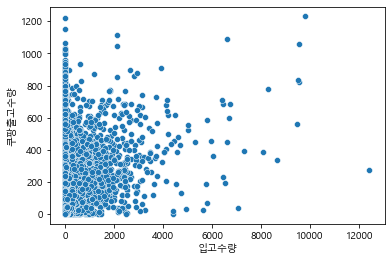

In [173]:
df1
sns.scatterplot(df1, x = '입고수량', y = '쿠팡출고수량')

## 시각화 

In [63]:
import plotly.express as px

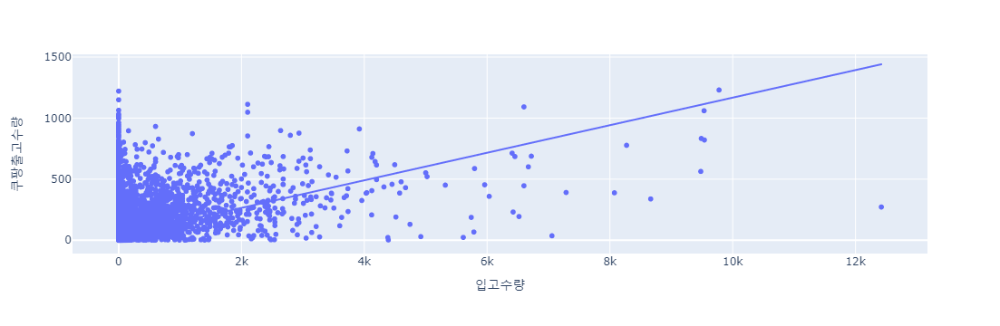

In [66]:
px.scatter(df1, x = '입고수량', y = '쿠팡출고수량',trendline = 'ols')
# trendline = 'ols' -> 회귀선이 그러진다
# ordinary Least square : 최소제곱법

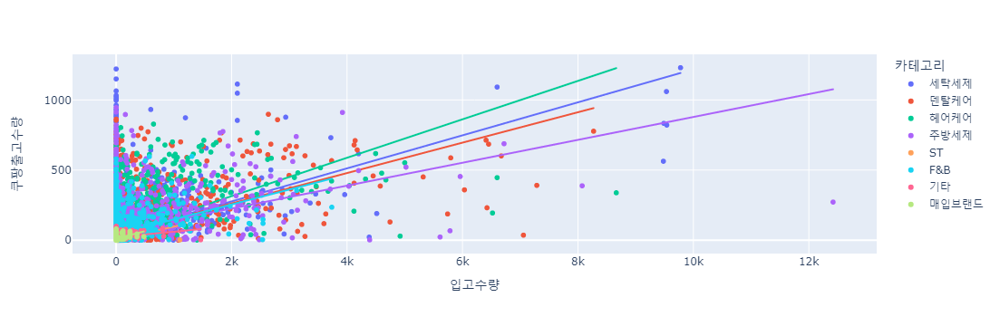

In [67]:
px.scatter(df1, x = '입고수량', y = '쿠팡출고수량',trendline = 'ols',
           color = '카테고리')

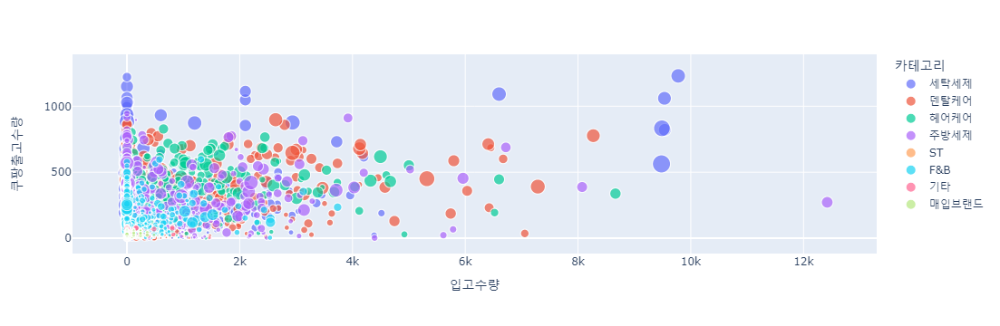

In [68]:
# size : 숫자에 정보량을 넣고 싶을 때
px.scatter(df1, x = '입고수량', y = '쿠팡출고수량',color = '카테고리',
          size = '쿠팡현재재고수량')
# 동그라미가 클수록 쿠팡현재재고수량 크기 확인
# 3가지 기준 : 입고, 쿠팡출고수량, 쿠팡현재재고수량

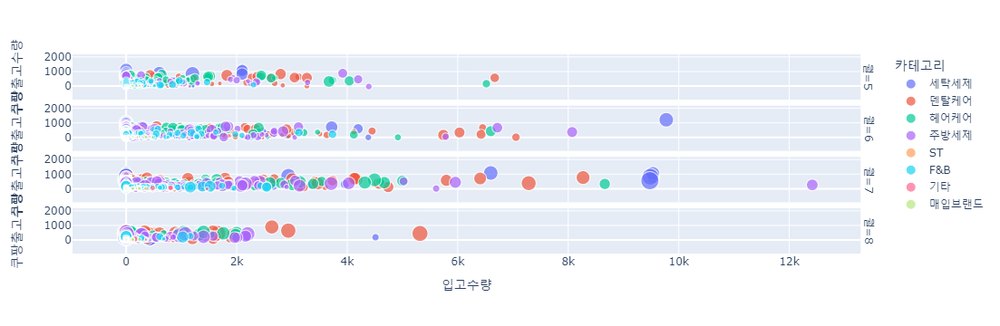

In [69]:
# 월별로 나눠서 보기
# subplot
px.scatter(df1,x = '입고수량', y = '쿠팡출고수량', size = '쿠팡현재재고수량',
           color = '카테고리', facet_row = '월')

In [ ]:
# 시각화
# 단일변수 : 범주형 / 연속형
# 다변수 : 
# 1. 연속 연속
# 2. 범주 연속
# 3. 순서

<Axes: xlabel='날짜_dt', ylabel='쿠팡출고수량'>

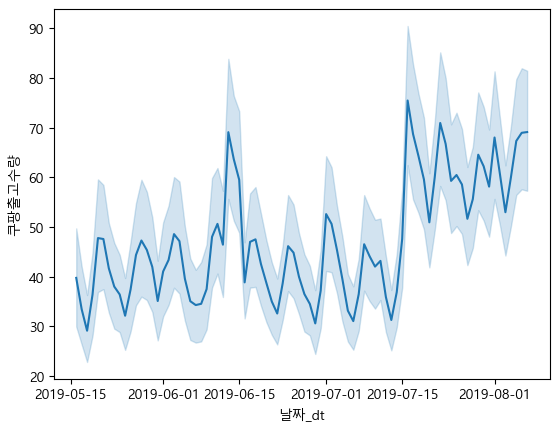

In [72]:
sns.lineplot(df1, x = '날짜_dt',y = '쿠팡출고수량')
# 기본적으로 평균을 보여준다

<Axes: xlabel='날짜_dt', ylabel='쿠팡출고수량'>

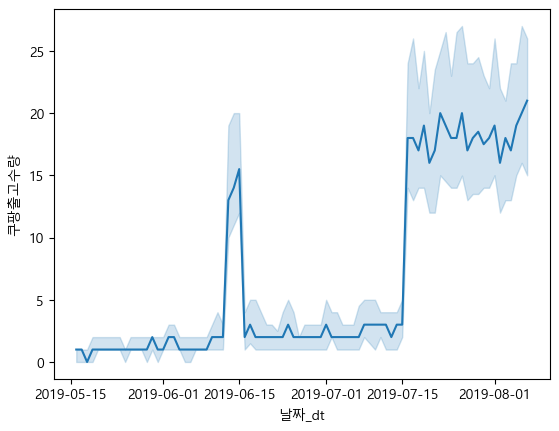

In [75]:
sns.lineplot(df1,x = '날짜_dt', y='쿠팡출고수량', estimator = 'median')

<Axes: xlabel='날짜_dt', ylabel='쿠팡출고수량'>

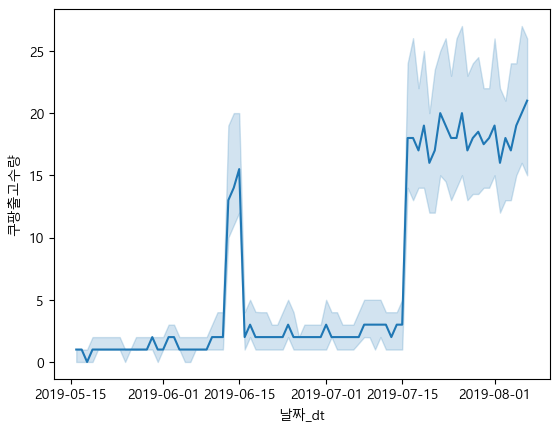

In [78]:
sns.lineplot(df1,x = '날짜_dt', y = '쿠팡출고수량', estimator = 'median')
# estimator : sum / median / count (개수)

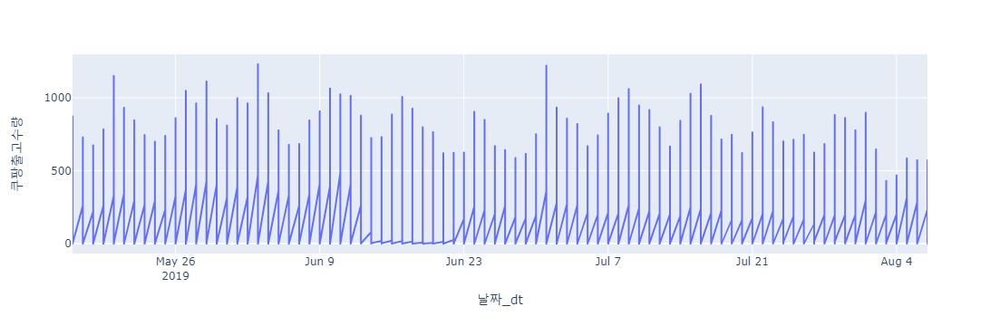

In [81]:
# plotlt : 날짜별 / 순서형 데이터 시각화
# 커서를 올렸을 때, 모든 데이터를 볼 수 있게 하려고 만든 라이브러리
# 모든 데이터를 다 표현하기에 직관적으로 이해가 쉽지 않다.
# 그래서 bar chart, line chart를 그릴 떄(한눈에 보이는 간단 시각화)는 피봇테이블을 사용해서 그려야 한다

px.line(df1,x = '날짜_dt', y = '쿠팡출고수량')

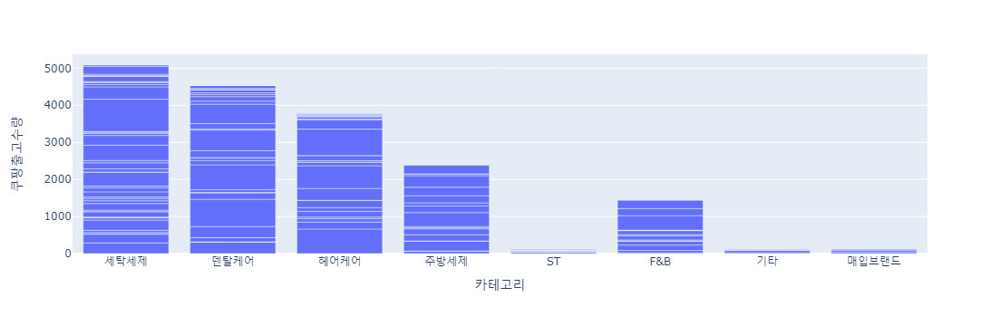

In [82]:
px.bar(df1.head(200),x = '카테고리', y = '쿠팡출고수량')
# 합이나 평균 보려면 피봇그려야함

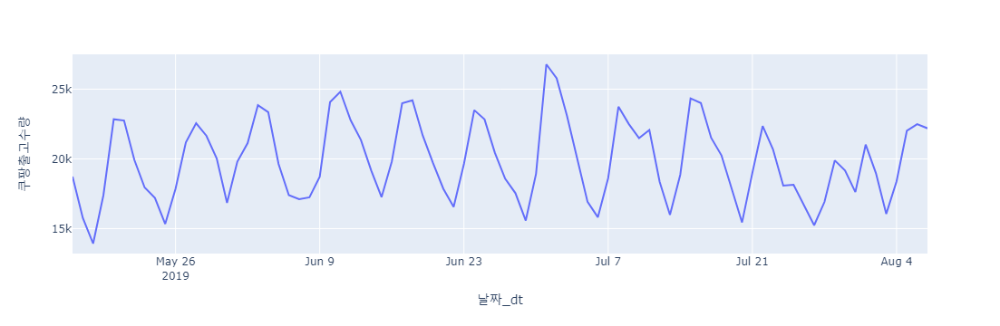

In [84]:
# 날짜별 쿠팡출고수량을 plotly로 표현해보자
p1 = df1.pivot_table(index = '날짜_dt',values= '쿠팡출고수량',
                    aggfunc = 'sum').reset_index()
px.line(p1,x = '날짜_dt', y = '쿠팡출고수량')

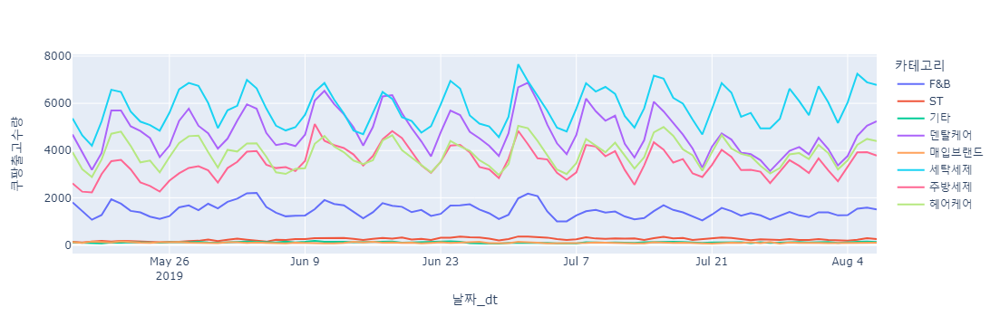

In [85]:
# 날짜별 쿠팡출고수량을 plotly로 표현해보자
p2 = df1.pivot_table(index = ['날짜_dt','카테고리'],values= '쿠팡출고수량',
                    aggfunc = 'sum').reset_index()
px.line(p2, x = '날짜_dt', y = '쿠팡출고수량', color = '카테고리')

In [89]:
fig = px.line(p2, x='날짜_dt', y = '쿠팡출고수량', color = '카테고리')
fig.write_html('plotly쿠팡.html')

<Axes: xlabel='날짜_dt', ylabel='쿠팡출고수량'>

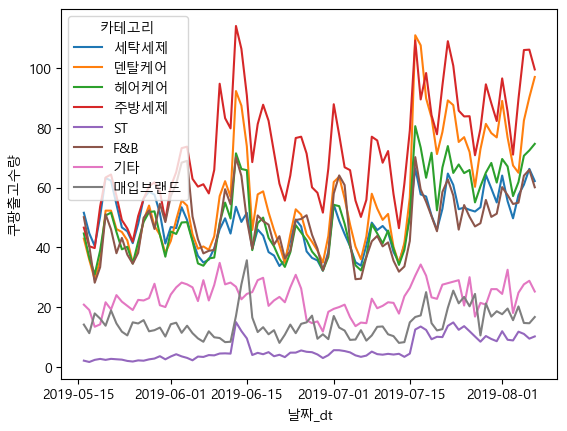

In [91]:
# seaborn으로 그리기
sns.lineplot(df1, x='날짜_dt', y = '쿠팡출고수량', hue = '카테고리', errorbar=None)

In [92]:
# 카테고리 별 비중 확인
# pie chart

In [94]:
v1 = df1['카테고리'].value_counts()
v1

카테고리
세탁세제     10339
덴탈케어      7596
헤어케어      6812
ST        4361
주방세제      4142
F&B       2583
매입브랜드      593
기타         407
Name: count, dtype: int64

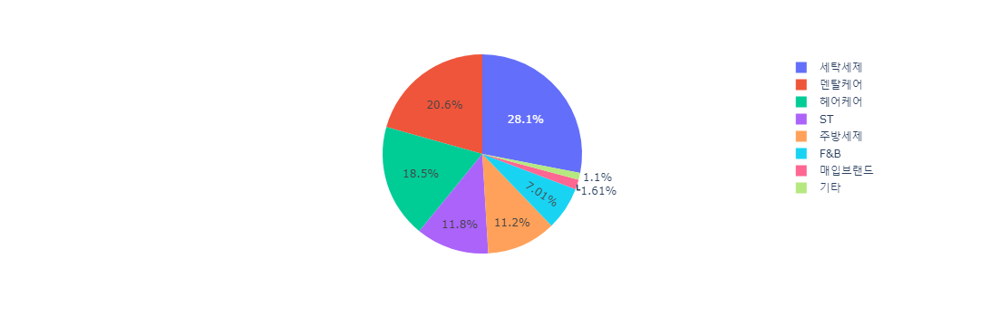

In [96]:
px.pie(v1,names = v1.index, values = v1.values)

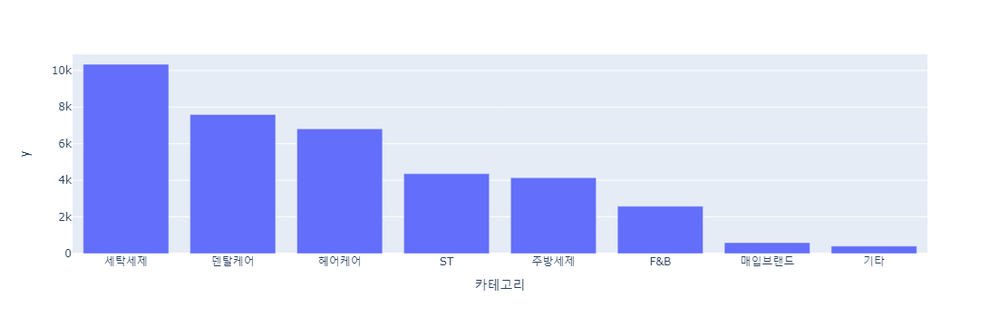

In [97]:
px.bar(v1, x = v1.index, y=v1.values)

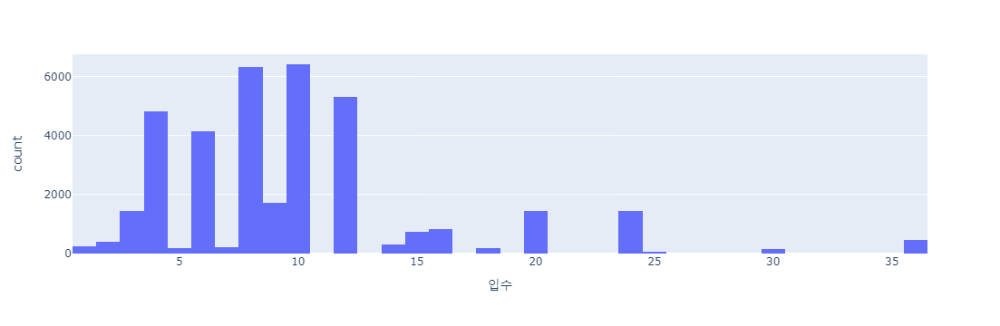

In [98]:
px.histogram(df1, x = '입수')

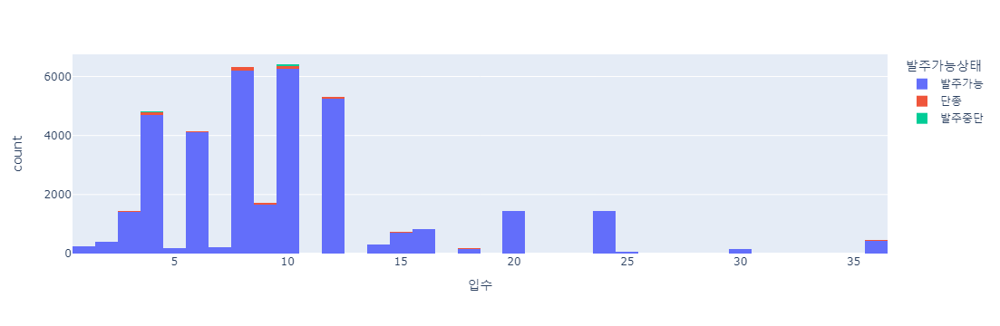

In [100]:
px.histogram(df1, x = '입수', color = '발주가능상태')

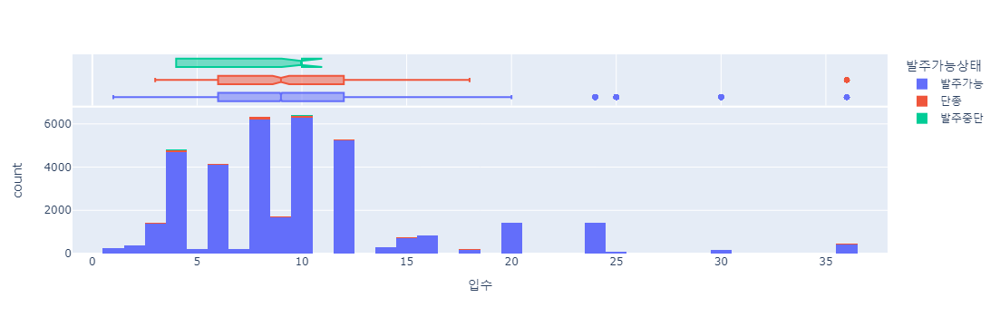

In [101]:
# 위 상태에서 분포를 그려주는 옵션
# marginal = 'box'

px.histogram(df1, x = '입수', color = '발주가능상태', marginal='box')

In [ ]:
# 단일형
# 1.범주
# 2.연속
# 다중
# 1.범주 / 연속
# 2.연속 / 연속
# 3.시계열